<a href="https://colab.research.google.com/github/Kat-ies/Coursework/blob/sliding_window/face_detection/Sliding_window.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#!git clone https://github.com/Kat-ies/Coursework.git
!git clone --single-branch --branch sliding_window https://github.com/Kat-ies/Coursework.git
%cd Coursework/src
%run for_google_drive.py

Mounted at /content/drive


# **Sliding window**

### Код пока будет в ноутбуке, тк он даёт довольно странные результаты, а дебажить в таком виде быстрее.  

Основная идея:

*   Шаг 0: генерируем сканирующие окна. Для простоты полагаем, что все окна имеют квадратный размер, а минимальный размер - 25 * 25 (именно на таком размере картинок обучались классификаторы).   
Скользящее окно проходит по всему изображению с заданным шагом (краевые случаи также обрабатываются), а затем размер окна увеличивается и процесс повторяется. Количество сканирующих окон зависит от размера картинки и от коэффициентов отступа и масштабирования.  

*   Шаг 1: превращаем изображение в признаки. Для этого "нарезаем" исходное изображение и делаем векторы признаков по аналогии с курсовым проектом. Здесь также происходит масштабирование полученных признаков, также все признаки (независимо от размера окна) приводятся к одному размеру. Отдельно можно выбрать тип признака, который будет считаться для дальнейшей работы. В зависимости от выбранного типа будет выбираться (автоматически) классификатор, обученный на соответствующем типе признаков.
*    Шаг 2: predict. Берём классификатор + признаки --> номер класса + вероятность. Здесь же сразу отсекаем по пороговому значению часть полученных результатов.  
  
*    Шаг 3: получение окончательного результата путём применения [non-maximum suppression](https://towardsdatascience.com/non-maximum-suppression-nms-93ce178e177c)



In [2]:
from data_loader import load_ml_model
from enum import IntEnum
from constants import *
import numpy as np
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from feature_creation.features import feature_creating, parse_file
from face_detection.evaluator import Evaluator

class Clf(IntEnum):
    LOG_REG = 0
    DEC_TREE = 1
    KNN = 2
    RAND_FOREST = 4
    ADA_BOOST = 5
    GRAD_BOOST = 6


class SlidingWindow:

    def __init__(self, clf_type=Clf.RAND_FOREST, feature_type='hf'):
        """
        new window size = old window size * scaling_factor
        new window koordinate = old window koordinate * padding_koef
        (if padding_koef == 1.3, it means that new window koordinate = old window koordinate + old window koordinate * 0.3)
        """
        self.scaling_factor = 1.25
        self.padding_koef = 1.3
        self.MIN_WINDOW_SIZE = 25
        self.clf = load_ml_model(COL_LIST[clf_type] + feature_type)
        self.feature_type = feature_type


    def generate_windows(self, img_w, img_h):
        windows = []

        for size  in range(self.MIN_WINDOW_SIZE, min(img_w, img_h),
                                                  int(self.MIN_WINDOW_SIZE * self.scaling_factor)):
            for y in range(0, img_h, int(size * self.padding_koef)):
                for x in range(0, img_w, int(size * self.padding_koef)):
 
                    windows.append((x, y, x + size, y + size))
                # добавим самый крайний правый столбец окон для полного покрытия изображения
                windows.append((img_w - size, y, img_w, y + size))
            
            # отдельно добавим нижний ряд окон
            for x in range(0, img_w, int(size * self.padding_koef)):
                windows.append((x, img_h - size, x + size, img_h))
            windows.append((img_w - size, img_h - size, img_w, img_h))

        return windows


    def create_features(self, image):
        
        if str(type(image)) != '<class \'PIL.JpegImagePlugin.JpegImageFile\'>' and \
        str(type(image)) !=  '<class \'PIL.Image.Image\'>':
            image = Image.open(image)
        image = image.convert("L")

        if (self.MIN_WINDOW_SIZE, self.MIN_WINDOW_SIZE) > image.size:
            print('Too small image, choose image with bigger size!')
            return

        windows = self.generate_windows(image.size[0], image.size[1])

        features = []
        h_features = parse_file()

        for window in windows:
            img = np.array(image.crop(window).resize(MAXSIZE, Image.LANCZOS), dtype='uint8')

            if self.feature_type != 'hf':
                features.append(img.flatten())

            else:
                matrix = np.cumsum(np.cumsum(img, axis=0), axis=1)
                f_for_one_img = []
                for fichi in h_features:
                    f_for_one_img.append(fichi.calc_feature(matrix))
                features.append(f_for_one_img)
        
        scaler = StandardScaler()
        features = scaler.fit_transform(features)

                    
        if self.feature_type == 'mf_pca':
            pca = PCA(n_components=min(len(h_features), len(features)))
            features = pca.fit_transform(features)

        return features, windows

    def find_boxes(self, image, threshold):
        features, windows = self.create_features(image)

        classes = self.clf.predict(features)
        probability = self.clf.predict_proba(features)

        boxes = []
        scores = []

        for i, (cl, proba) in enumerate(zip(classes, probability)):
            #print(cl, proba)
            if cl == 1 and proba[0] >= threshold:
                boxes.append(windows[i])
                scores.append(proba[0])
                
        return boxes, scores

    def non_maximum_suppression(self, boxes, scores, iou_threshold):
        final_boxes = {"boxes":[], "scores":[]}

        while len(boxes) != 0:
            index = scores.index(max(scores))
            cur_box = boxes[index]

            final_boxes['boxes'].append(boxes[index])
            #final_boxes['labels'].append(1)
            final_boxes['scores'].append(scores[index])

            del boxes[index]
            del scores[index]

            for box, score in zip(boxes, scores):
                iou = Evaluator.iou(cur_box, box)
                #print(iou)
                if iou >= iou_threshold:
                    #print(len(boxes))
                    del box
                    del score
                    #print(len(boxes))
        return final_boxes


    def detect(self, image, score_threshold=0.48, iou_threshold=0.4):
        candidates = self.find_boxes(image, score_threshold)
        print(len(candidates[0]))
        return self.non_maximum_suppression(*candidates, iou_threshold)


In [3]:
image = '/content/Coursework/src/PBK_2098.JPG'
#image = Image.open(image).resize((800,800), Image.LANCZOS)
image

'/content/Coursework/src/PBK_2098.JPG'

In [4]:
sl = SlidingWindow(feature_type='hf', clf_type=Clf.RAND_FOREST)
boxes = sl.detect(image)

/content/Coursework/src/feature_creation/features.py:58: RuntimeWarning: overflow encountered in ulong_scalars
  + cumsum_matrix[rects.y - 1][rects.x - 1]) * rects.weight


998


In [5]:
print(len(boxes['boxes']))

998


In [ ]:
print(boxes)

{'boxes': [(0, 2740, 211, 2951), (5312, 3744, 5337, 3769), (2400, 1408, 2425, 1433), (3616, 2464, 3641, 2489), (5404, 1930, 5553, 2079), (1351, 2123, 1500, 2272), (2208, 3776, 2233, 3801), (3200, 3104, 3225, 3129), (5805, 822, 6016, 1033), (2370, 395, 2674, 699), (4680, 432, 4736, 488), (3936, 2016, 3961, 2041), (3692, 0, 5112, 1420), (4640, 608, 4665, 633), (3392, 2848, 3417, 2873), (5472, 1224, 5528, 1280), (5991, 1440, 6016, 1465), (5152, 1504, 5177, 1529), (2880, 1944, 2936, 2000), (4480, 64, 4505, 89), (5568, 3136, 5593, 3161), (800, 2848, 825, 2873), (4672, 2912, 4697, 2937), (3168, 3360, 3193, 3385), (4032, 1600, 4057, 1625), (4512, 1120, 4537, 1145), (5184, 96, 5209, 121), (5760, 1152, 5816, 1208), (3104, 3872, 3129, 3897), (5480, 3014, 5691, 3225), (1952, 1312, 1977, 1337), (2912, 704, 2937, 729), (5400, 0, 5456, 56), (5984, 1536, 6009, 1561), (3072, 1024, 3097, 1049), (576, 1248, 601, 1273), (5404, 193, 5553, 342), (5472, 2368, 5497, 2393), (3968, 1568, 3993, 1593), (4608, 29

In [6]:
from face_detection.bounding_box import BoundingBox
from face_detection.utils_for_mAP import CoordinatesType, BBType, BBFormat
from constants import *
from face_detection.transforms import test_transforms
import torch
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
import numpy as np

In [7]:
def show_predictions(images, predictions, threshold):
    fig = plt.figure(figsize=(60, 70))
    cols = 1
    rows = len(images)

    # ax enables access to manipulate each of subplots
    ax = []
    i = 0

    for image in images:

        boxes = predictions['boxes']
        scores = predictions['scores']

        ax.append(fig.add_subplot(rows, cols, i + 1))
        i += 1

        for box, score in zip(boxes, scores):

            if score < threshold:
                continue

            img1 = ImageDraw.Draw(image)
            img1.rectangle(box, fill=None, outline="red")

            img2 = ImageDraw.Draw(image)
            img2.rectangle((box[0], box[1],
                            box[0] + SCORE_BACKGROUND_LABEL_WIDTH,
                            box[1] + SCORE_BACKGROUND_LABEL_HEIGHT),
                           fill='black', outline="black")

            img3 = ImageDraw.Draw(image)
            img3.text((box[0], box[1]), 'score: ' + f"{score:.{2}f}")

        plt.imshow(image)
        break

    plt.show()  # finally, render the plot

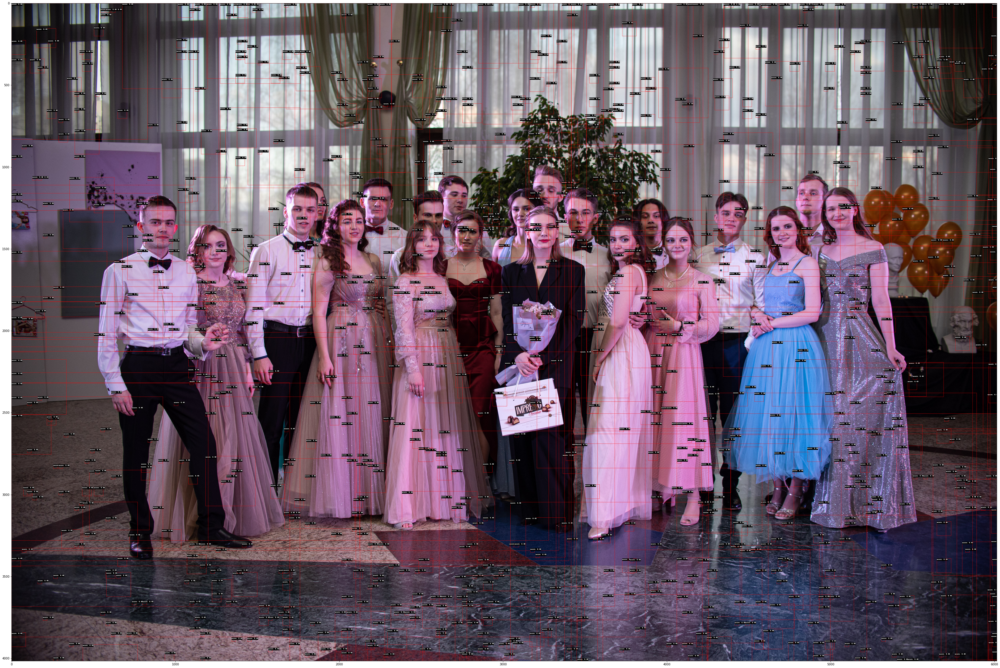

In [8]:
show_predictions([Image.open(image)], boxes, threshold=0)

In [ ]:
boxA = (5,5,10,10)
boxB = (0,0,20,20)
iou = Evaluator.iou(boxA, boxB)
print(iou)

0.08163265306122448


In [ ]:
if Evaluator._boxesIntersect(boxA, boxB):
    print('ok')

interArea = Evaluator._getIntersectionArea(boxA, boxB)
union = Evaluator._getUnionAreas(boxA, boxB, interArea=interArea)
# intersection over union
iou = interArea / union
print(interArea)
print(union)

ok
36
441.0
